## instalaciones

In [1]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.3/46.3 kB 4.7 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of category-encoders to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 85.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.5/51.5 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 106.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3

In [1]:
import pandas as pd
import numpy as np

# MODELO DEFINITIVO SIN FOTOS

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Ruta Laura

df = pd.read_csv('/content/drive/MyDrive/TFM/datos.csv')


In [ ]:
# Ruta Ángel

#df = pd.read_csv('/content/drive/MyDrive/CEU SAN PABLO/TFM/datos.csv')


# Ruta con metro

df = pd.read_csv('/content/drive/MyDrive/CEU SAN PABLO/TFM/datos_plus.csv')

# 1. Visualizaciones

In [4]:

# Asegúrate de que df_final es el DataFrame que estás utilizando
# y que contiene las columnas 'property_price', 'Chamberi', 'Centro', 'Arganzuela', 'Retiro'

# Media de precio para Chamberí
mean_price_chamberi = df[df['neighborhood'] == 1]['property_price'].mean()
print(f"Media del precio en Chamberi: {mean_price_chamberi/(1000):.2f}k")

# Media de precio para Centro
mean_price_centro = df[df['neighborhood'] == 2]['property_price'].mean()
print(f"Media del precio en Centro: {mean_price_centro/(1000):.2f}k")

# Media de precio para Arganzuela
mean_price_arganzuela = df[df['neighborhood'] == 3]['property_price'].mean()
print(f"Media del precio en Arganzuela: {mean_price_arganzuela/(1000):.2f}k")

# Media de precio para Retiro
mean_price_retiro = df[df['neighborhood'] == 4]['property_price'].mean()
print(f"Media del precio en Retiro: {mean_price_retiro/(1000):.2f}k")

Media del precio en Chamberi: 1576.01k
Media del precio en Centro: 1639.70k
Media del precio en Arganzuela: 499.86k
Media del precio en Retiro: 1204.72k


In [ ]:
import folium
from folium.plugins import HeatMap

# Filtrar datos válidos (sin NaN)
df_clean = df.dropna(subset=['latitude', 'longitude', 'property_price'])

# Crear mapa centrado en Madrid
mapa = folium.Map(location=[40.4168, -3.7038], zoom_start=12)

# Datos para el heatmap: [lat, lon, precio]
heat_data = df_clean[['latitude', 'longitude', 'property_price']].values.tolist()

# Añadir capa de calor
HeatMap(heat_data, radius=15, blur=10).add_to(mapa)

# Guardar y mostrar
mapa.save('mapa_calor_precios.html')
mapa

In [ ]:
import folium
import branca.colormap as cm
import pandas as pd

# Asegúrate de tener:
# df_final['latitude'], df_final['longitude'], df_final['property_price']

# Crear el mapa centrado en la media de coordenadas
m = folium.Map(
    location=[df['latitude'].mean(), df['longitude'].mean()],
    zoom_start=13,
    tiles='cartodbpositron'
)

# Crear una escala de colores según el precio
min_price = df['property_price'].min()
max_price = df['property_price'].max()
colormap = cm.linear.YlOrRd_09.scale(min_price, max_price)
colormap.caption = 'Precio de vivienda (€)'
colormap.add_to(m)

# Añadir cada punto al mapa
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=colormap(row['property_price']),
        fill=True,
        fill_color=colormap(row['property_price']),
        fill_opacity=0.7,
        popup=f"{row['property_price']:.0f} €"
    ).add_to(m)

# Guardar o mostrar el mapa
m.save("mapa_precios.html")
m  # Solo si estás en un Jupyter Notebook

# 2. Nutrir dataset

In [ ]:
!pip install osmnx

In [ ]:
import osmnx as ox
import geopandas as gpd
import pandas as pd
from scipy.spatial import cKDTree
from geopy.distance import geodesic
import numpy as np

# Define el lugar
place_name = "Madrid, Spain"

# 1. Obtener el polígono geográfico de la ciudad
city = ox.geocode_to_gdf(place_name)

# 2. Descargar estaciones de metro
metro_tags = {'railway': 'station', 'station': 'subway'}
metro_stops = ox.features_from_polygon(city.geometry[0], metro_tags)



# 1. Reproyectar las geometrías a un sistema de coordenadas en metros (CRS proyectado)
metro_stops_proj = metro_stops.to_crs(epsg=3857)  # Web Mercator: usa metros
pisos_gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs='EPSG:4326')
pisos_gdf = pisos_gdf.to_crs(epsg=3857)

# 2. Extraer coordenadas X, Y de las geometrías proyectadas (en metros)
metro_coords = np.array([(geom.centroid.y, geom.centroid.x) for geom in metro_stops_proj.geometry])
pisos_coords = np.array([(geom.y, geom.x) for geom in pisos_gdf.geometry])

# 3. Construir el KD-Tree y calcular distancias
metro_tree = cKDTree(metro_coords)
dist_metro_m, idx_metro = metro_tree.query(pisos_coords, k=1)

# 4. Añadir distancia al DataFrame original
df['dist_metro_m'] = dist_metro_m

In [ ]:
df.to_csv('/content/drive/MyDrive/TFM/datos_limpiometro.csv', index=False)

In [8]:
df_metro = pd.read_csv('/content/drive/MyDrive/TFM/datos_limpiometro.csv')
df_metro

,address,agency_name,bathroom_count,bedroom_count,energy_certificate,floor,latitude,longitude,lot_size,property_description,property_images,property_price,property_title,property_type,neighborhood,exterior,ascensor,dist_metro_m
0,Calle de Zurbano,Ambassador,4,5,c,5.0,40.435694,-3.691642,344,Fantástico tríplex muy luminoso y bien ubicado...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,3300000,Ático en calle de Zurbano,flat,1,1.0,1.0,339.756321
1,Calle de Zurbano,Walter Haus Madrid,4,6,b,5.0,40.433373,-3.693010,355,"Este exclusivo inmueble, ubicado en el prestig...",['https://img4.idealista.com/blur/WEB_DETAIL-X...,3300000,Ático triplex exterior en venta con terraza y ...,flat,1,1.0,1.0,372.735657
2,Calle de Hilarión Eslava,Walter Haus Madrid,5,5,e,2.0,40.435637,-3.716426,265,"Presentamos una espectacular vivienda de lujo,...",['https://img4.idealista.com/blur/WEB_DETAIL-X...,1975000,Piso en venta exterior con terraza en Chamberí...,flat,1,1.0,1.0,325.628226
3,Paseo de Eduardo Dato,Ambassador,4,3,d,7.0,40.433065,-3.691495,548,Piso señorial muy luminoso de 548 m2 situado ...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,6200000,Piso en paseo de Eduardo Dato,flat,1,1.0,1.0,200.981366
4,Calle de Francisco de Rojas,Walter Haus Madrid,3,3,c,3.0,40.430204,-3.698828,227,Vivienda totalmente reformada y amueblada que ...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,2200000,Piso señorial en venta exterior reformado y am...,flat,1,1.0,1.0,371.309203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227,Calle de Amado Nervo,Jowner,5,6,c,2.0,40.409615,-3.677602,252,“JOWNER VENDE DÚPLEX ÚNICO EN PLENO CORAZÓN DE...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,1835000,Dúplex en calle de Amado Nervo,flat,4,1.0,1.0,869.431319
1228,Calle del Alcalde Sainz de Baranda,Huspy,2,3,e,0.0,40.417227,-3.674110,119,"Oportunidad de reforma en el corazón de Ibiza,...",['https://img4.idealista.com/blur/WEB_DETAIL-X...,955000,Piso en calle del Alcalde Sainz de Baranda,flat,4,0.0,1.0,478.318288
1229,Calle de Sánchez Barcáiztegui,Servifincas,2,3,a,1.0,40.407080,-3.673105,107,Si estás buscando un piso de 3 habitaciones an...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,670000,Piso en calle de Sánchez Barcáiztegui,flat,4,1.0,1.0,349.150100
1230,Calle de Máiquez,PUBLICASA MADRID,1,3,d,5.0,40.418837,-3.673959,115,Se aceptan contraofertas! \n\nPublicasa les of...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,895000,Piso en calle de Máiquez,flat,4,0.0,1.0,470.223366


# 3. Funciones de estudio

In [9]:
def info_inicial(df):
    # Mapeo de neighborhoods
    neighborhood_map = {
        1: 'Chamberí',
        2: 'Centro',
        3: 'Arganzuela',
        4: 'Retiro'
    }

    df['neighborhood'] = df['neighborhood'].map(neighborhood_map)

    # Estadísticas de property_price
    precio_promedio = df['property_price'].mean()
    precio_min = df['property_price'].min()
    precio_max = df['property_price'].max()

    # Estadísticas de otros campos
    metros_promedio = df['lot_size'].mean()
    banos_promedio = df['bathroom_count'].mean()
    habitaciones_promedio = df['bedroom_count'].mean()

    # Mostrar resultados
    print(f"Nuḿero de datos:\n{len(df)}")
    print(f"\nPrecio promedio: {precio_promedio/1000:.2f} k€")
    print(f"Precio mínimo: {precio_min/1000:.2f} k€")
    print(f"Precio máximo: {precio_max/1000:.2f} k€")
    print(f"\nPromedio de metros cuadrados: {metros_promedio:.2f} m²")
    print(f"Promedio de baños: {banos_promedio:.2f}")
    print(f"Promedio de habitaciones: {habitaciones_promedio:.2f}")

    return df  # Devuelve el df actualizado con los nombres de barrios


In [10]:
def eliminar_outliers(df):
    df_original = df.copy()
    numeric_cols = df.select_dtypes(include='number').columns

    # Outliers en property_price con IQR
    Q1 = df['property_price'].quantile(0.25)
    Q3 = df['property_price'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrado
    df = df[(df['property_price'] >= lower_bound) & (df['property_price'] <= upper_bound)]
    filas_eliminadas = df_original.shape[0] - df.shape[0]

    print(f"\n----Outliers Eliminados ----")
    print(f"Filas eliminadas por outliers en 'property_price': {filas_eliminadas}")

    # Contar outliers en otras columnas numéricas
    print("\nValores atípicos en otras columnas numéricas:")
    for col in numeric_cols:
        if col != 'property_price':
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0]
            print(f" - {col}: {outliers} valores atípicos")

    return df

In [11]:
def transformar_variables(df):
    df = df.copy()

    # One-Hot Encoding de 'property_type'
    df = pd.get_dummies(df, columns=['property_type'], prefix='property_type')

    # Mapear certificado energético a números
    energy_certificate_order = ['a', 'b', 'c', 'd', 'e', 'f', 'g']
    energy_certificate_mapping = {cert: i for i, cert in enumerate(energy_certificate_order)}
    df['energy_certificate_encoded'] = df['energy_certificate'].str.lower().map(energy_certificate_mapping)

    # Eliminar columna original
    df = df.drop('energy_certificate', axis=1)
    print('---- variables transformadas correctamente-------')
    return df


In [12]:
from pycaret.regression import *

def mejor_modelo_pycaret(df, features):
    print('\n-----Evaluando modelos con pycaret------')

    df_pycaret = df[features + ['property_price']]

    setup(
        data=df_pycaret,
        target='property_price',
        session_id=42,
        train_size=0.8,
        normalize=True,
        verbose=False
    )

    # Añade verbose=False para evitar salida innecesaria
    best_model_pycaret = compare_models(sort='RMSE', verbose=False)

    # Usamos pull para capturar la tabla sin mostrarla
    resultados = pull();  # El punto y coma evita que Jupyter la muestre

    mejor_fila = resultados.loc[resultados['RMSE'].idxmin()]
    nombre_modelo = mejor_fila['Model']
    rmse = mejor_fila['RMSE']

    precio_medio = df['property_price'].mean()
    error_porcentual = (rmse / precio_medio) * 100

    print("=== Mejor Modelo ===")
    print(f"Modelo: {nombre_modelo}")
    print(f"RMSE: {rmse:.2f}")
    print(f"Error porcentual sobre precio promedio: {error_porcentual:.2f}%")

    return best_model_pycaret


In [13]:
from pycaret.regression import plot_model
import matplotlib.pyplot as plt

def visualizaciones_modelo(df, modelo):
    print("\nVisualizaciones del modelo:")

    # Guardar los gráficos en archivos temporales
    plot_model(modelo, plot='feature', save=True)
    plot_model(modelo, plot='residuals', save=True)
    plot_model(modelo, plot='error', save=True)

    # Los archivos generados se llaman:
    # 'Feature Importance.png', 'Residuals.png', 'Prediction Error.png'
    # (o similar, depende versión PyCaret y plot)

    img1 = plt.imread('Feature Importance.png')
    img2 = plt.imread('Residuals.png')
    img3 = plt.imread('Prediction Error.png')

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(img1)
    axes[0].axis('off')
    axes[0].set_title('Importancia Variables')

    axes[1].imshow(img2)
    axes[1].axis('off')
    axes[1].set_title('Residuos')

    axes[2].imshow(img3)
    axes[2].axis('off')
    axes[2].set_title('Predicciones vs Reales')

    plt.tight_layout()
    plt.show()




# 4. Modelo por zonas


================= Análisis para CHAMBERI =================
----- Info preliminar -----
Nuḿero de datos:
392

Precio promedio: 1576.01 k€
Precio mínimo: 250.00 k€
Precio máximo: 7250.00 k€

Promedio de metros cuadrados: 168.65 m²
Promedio de baños: 2.51
Promedio de habitaciones: 3.05

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 25

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 0 valores atípicos
 - bedroom_count: 1 valores atípicos
 - floor: 3 valores atípicos
 - latitude: 0 valores atípicos
 - longitude: 0 valores atípicos
 - lot_size: 10 valores atípicos
 - exterior: 70 valores atípicos
 - ascensor: 22 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Gradient Boosting Regressor
RMSE: 263783.93
Error porcentual sobre precio promedio: 19.84%

Visualizaciones del modelo:


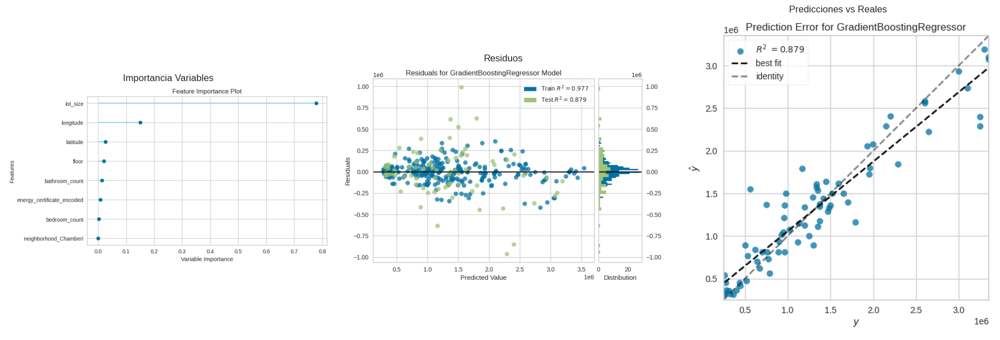


================= Análisis para CENTRO =================
----- Info preliminar -----
Nuḿero de datos:
446

Precio promedio: 1639.70 k€
Precio mínimo: 220.00 k€
Precio máximo: 9000.00 k€

Promedio de metros cuadrados: 280.46 m²
Promedio de baños: 3.28
Promedio de habitaciones: 3.72

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 12

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 18 valores atípicos
 - bedroom_count: 12 valores atípicos
 - floor: 12 valores atípicos
 - latitude: 0 valores atípicos
 - longitude: 0 valores atípicos
 - lot_size: 52 valores atípicos
 - exterior: 48 valores atípicos
 - ascensor: 57 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Extra Trees Regressor
RMSE: 356107.37
Error porcentual sobre precio promedio: 23.82%

Visualizaciones del modelo:


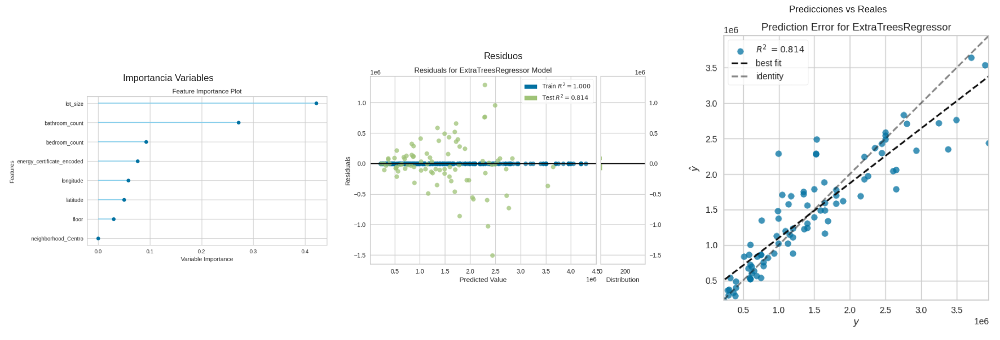


================= Análisis para ARGANZUELA =================
----- Info preliminar -----
Nuḿero de datos:
194

Precio promedio: 499.86 k€
Precio mínimo: 85.40 k€
Precio máximo: 1450.00 k€

Promedio de metros cuadrados: 87.32 m²
Promedio de baños: 1.44
Promedio de habitaciones: 2.45

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 6

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 0 valores atípicos
 - bedroom_count: 0 valores atípicos
 - floor: 0 valores atípicos
 - latitude: 1 valores atípicos
 - longitude: 0 valores atípicos
 - lot_size: 0 valores atípicos
 - exterior: 0 valores atípicos
 - ascensor: 22 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Extra Trees Regressor
RMSE: 69119.66
Error porcentual sobre precio promedio: 14.53%

Visualizaciones del modelo:


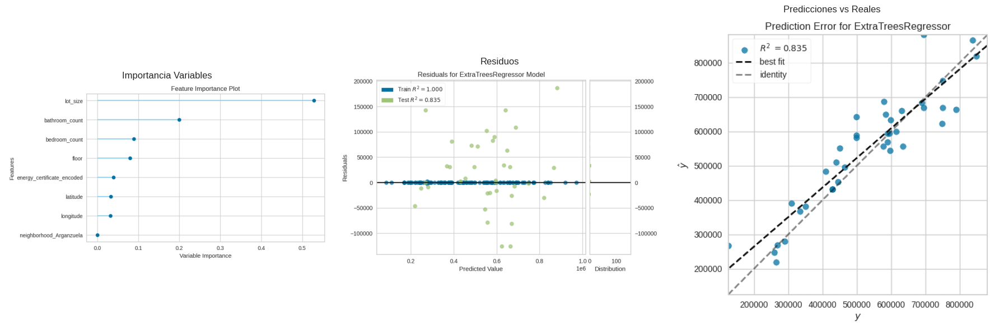


================= Análisis para RETIRO =================
----- Info preliminar -----
Nuḿero de datos:
200

Precio promedio: 1204.72 k€
Precio mínimo: 260.00 k€
Precio máximo: 4800.00 k€

Promedio de metros cuadrados: 135.07 m²
Promedio de baños: 2.12
Promedio de habitaciones: 2.83

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 28

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 7 valores atípicos
 - bedroom_count: 9 valores atípicos
 - floor: 1 valores atípicos
 - latitude: 0 valores atípicos
 - longitude: 6 valores atípicos
 - lot_size: 9 valores atípicos
 - exterior: 0 valores atípicos
 - ascensor: 12 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Extra Trees Regressor
RMSE: 174490.98
Error porcentual sobre precio promedio: 19.05%

Visualizaciones del modelo:


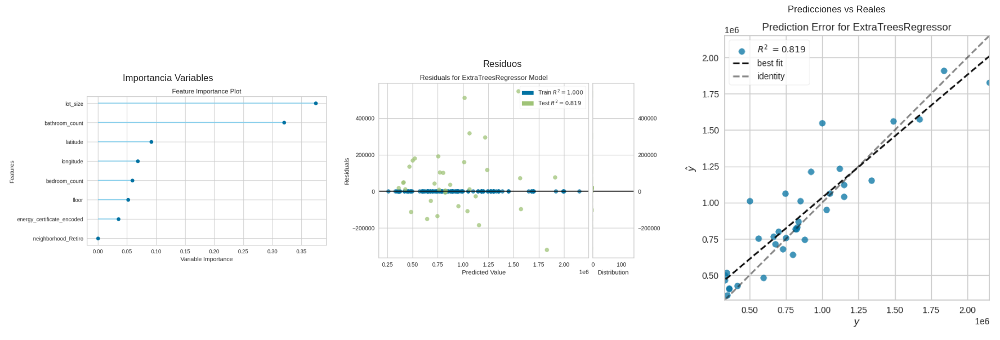

In [14]:
# Suponiendo que ya tienes estas funciones definidas:
# info_inicial, eliminar_outliers, transformar_variables, mejor_modelo_pycaret, visualizaciones_modelo

neighborhood_dict = {
    1: 'chamberi',
    2: 'centro',
    3: 'arganzuela',
    4: 'retiro'
}

features = ['bathroom_count',
 'bedroom_count',
 'energy_certificate_encoded',
 'floor',
 'neighborhood',
 'lot_size', 'longitude','latitude']

# Crear una lista para almacenar los DataFrames procesados de cada barrio
df_procesados = []

for codigo, nombre in neighborhood_dict.items():
    print(f"\n================= Análisis para {nombre.upper()} =================")

    # 1. Subset del dataset original
    print('----- Info preliminar -----')
    df_barrio = df[df['neighborhood'] == codigo].copy()

    # 2. Info inicial
    info_inicial(df_barrio)

    # 3. Eliminar outliers
    df_barrio = eliminar_outliers(df_barrio)

    # 4. Transformaciones
    df_barrio = transformar_variables(df_barrio)

    # Agregar el DataFrame procesado a la lista
    df_procesados.append(df_barrio)

    # 5. Modelo con PyCaret
    modelo = mejor_modelo_pycaret(df_barrio, features)

    # 6. Visualizaciones
    visualizaciones_modelo(df_barrio, modelo)


In [ ]:

# Combinar todos los DataFrames procesados en uno solo
df_final = pd.concat(df_procesados, ignore_index=True)

# Guardar el DataFrame final en un CSV
df_final.to_csv('/content/drive/MyDrive/TFM/datos_limpio.csv', index=False)
print("\nDataset final guardado como 'datos_limpio.csv'")
df_final


================= Análisis para CHAMBERI =================
----- Info preliminar -----
Nuḿero de datos:
392

Precio promedio: 1576.01 k€
Precio mínimo: 250.00 k€
Precio máximo: 7250.00 k€

Promedio de metros cuadrados: 168.65 m²
Promedio de baños: 2.51
Promedio de habitaciones: 3.05

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 25

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 0 valores atípicos
 - bedroom_count: 1 valores atípicos
 - floor: 3 valores atípicos
 - latitude: 0 valores atípicos
 - longitude: 0 valores atípicos
 - lot_size: 10 valores atípicos
 - exterior: 70 valores atípicos
 - ascensor: 22 valores atípicos
 - dist_metro_m: 0 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Gradient Boosting Regressor
RMSE: 259581.25
Error porcentual sobre precio promedio: 19.52%

Visualizaciones del modelo:


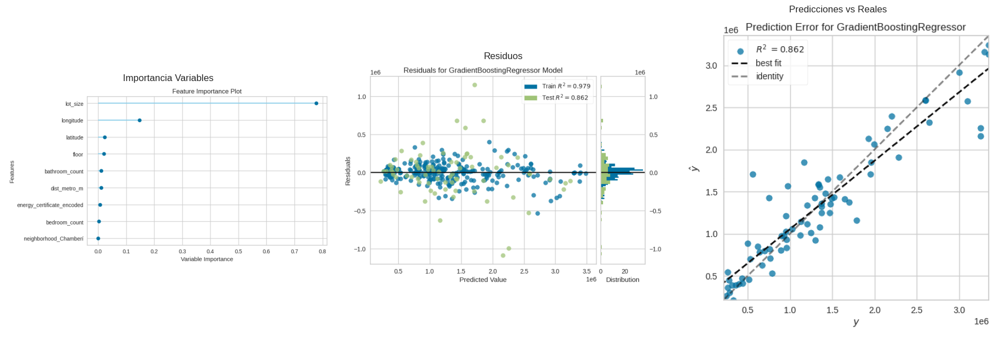


================= Análisis para CENTRO =================
----- Info preliminar -----
Nuḿero de datos:
446

Precio promedio: 1639.70 k€
Precio mínimo: 220.00 k€
Precio máximo: 9000.00 k€

Promedio de metros cuadrados: 280.46 m²
Promedio de baños: 3.28
Promedio de habitaciones: 3.72

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 12

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 18 valores atípicos
 - bedroom_count: 12 valores atípicos
 - floor: 12 valores atípicos
 - latitude: 0 valores atípicos
 - longitude: 0 valores atípicos
 - lot_size: 52 valores atípicos
 - exterior: 48 valores atípicos
 - ascensor: 57 valores atípicos
 - dist_metro_m: 22 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Extra Trees Regressor
RMSE: 355125.24
Error porcentual sobre precio promedio: 23.75%

Visualizaciones del modelo:


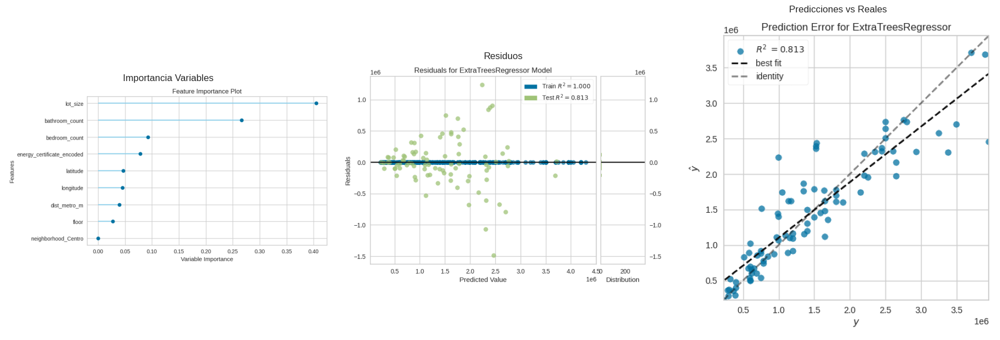


================= Análisis para ARGANZUELA =================
----- Info preliminar -----
Nuḿero de datos:
194

Precio promedio: 499.86 k€
Precio mínimo: 85.40 k€
Precio máximo: 1450.00 k€

Promedio de metros cuadrados: 87.32 m²
Promedio de baños: 1.44
Promedio de habitaciones: 2.45

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 6

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 0 valores atípicos
 - bedroom_count: 0 valores atípicos
 - floor: 0 valores atípicos
 - latitude: 1 valores atípicos
 - longitude: 0 valores atípicos
 - lot_size: 0 valores atípicos
 - exterior: 0 valores atípicos
 - ascensor: 22 valores atípicos
 - dist_metro_m: 0 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Extra Trees Regressor
RMSE: 68177.29
Error porcentual sobre precio promedio: 14.33%

Visualizaciones del modelo:


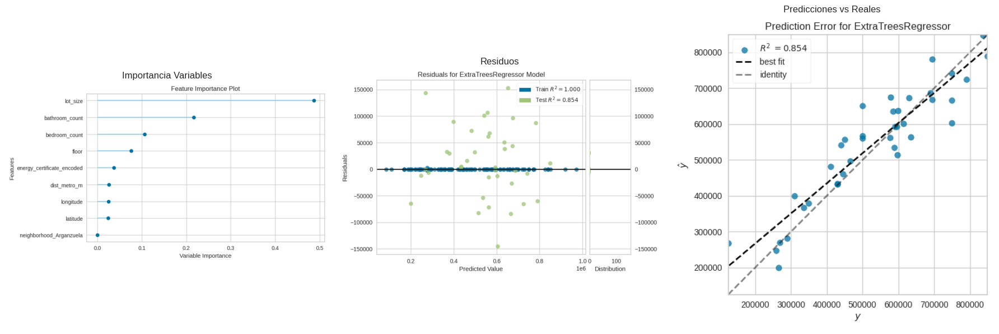


================= Análisis para RETIRO =================
----- Info preliminar -----
Nuḿero de datos:
200

Precio promedio: 1204.72 k€
Precio mínimo: 260.00 k€
Precio máximo: 4800.00 k€

Promedio de metros cuadrados: 135.07 m²
Promedio de baños: 2.12
Promedio de habitaciones: 2.83

----Outliers Eliminados ----
Filas eliminadas por outliers en 'property_price': 28

Valores atípicos en otras columnas numéricas:
 - bathroom_count: 7 valores atípicos
 - bedroom_count: 9 valores atípicos
 - floor: 1 valores atípicos
 - latitude: 0 valores atípicos
 - longitude: 6 valores atípicos
 - lot_size: 9 valores atípicos
 - exterior: 0 valores atípicos
 - ascensor: 12 valores atípicos
 - dist_metro_m: 2 valores atípicos
---- variables transformadas correctamente-------

-----Evaluando modelos con pycaret------
=== Mejor Modelo ===
Modelo: Extra Trees Regressor
RMSE: 180036.12
Error porcentual sobre precio promedio: 19.65%

Visualizaciones del modelo:


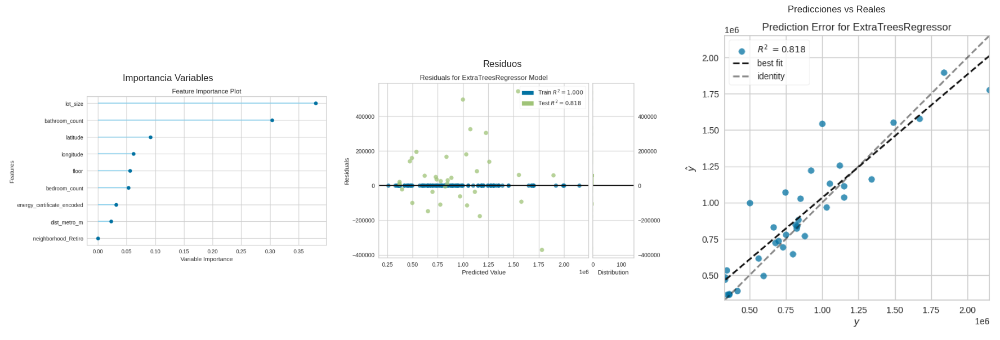

In [17]:

features = ['bathroom_count',
 'bedroom_count',
 'energy_certificate_encoded',
 'floor',
 'neighborhood',
 'lot_size', 'longitude','latitude','dist_metro_m']

# Crear una lista para almacenar los DataFrames procesados de cada barrio
df_procesados = []

for codigo, nombre in neighborhood_dict.items():
    print(f"\n================= Análisis para {nombre.upper()} =================")

    # 1. Subset del dataset original
    print('----- Info preliminar -----')
    df_barrio = df_metro[df_metro['neighborhood'] == codigo].copy()

    # 2. Info inicial
    info_inicial(df_barrio)

    # 3. Eliminar outliers
    df_barrio = eliminar_outliers(df_barrio)

    # 4. Transformaciones
    df_barrio = transformar_variables(df_barrio)

    # Agregar el DataFrame procesado a la lista
    df_procesados.append(df_barrio)

    # 5. Modelo con PyCaret
    modelo = mejor_modelo_pycaret(df_barrio, features)

    # 6. Visualizaciones
    visualizaciones_modelo(df_barrio, modelo)

# CON fotos

##PRUEBA TECHO

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
# Ruta Ángel con subcarpeta fotos

image_folder_path = '/content/drive/MyDrive/CEU SAN PABLO/TFM/fotos'

Listando y mostrando los primeros 4 archivos .webp que empiezan con 'foto_0_':
1: foto_1_1.webp


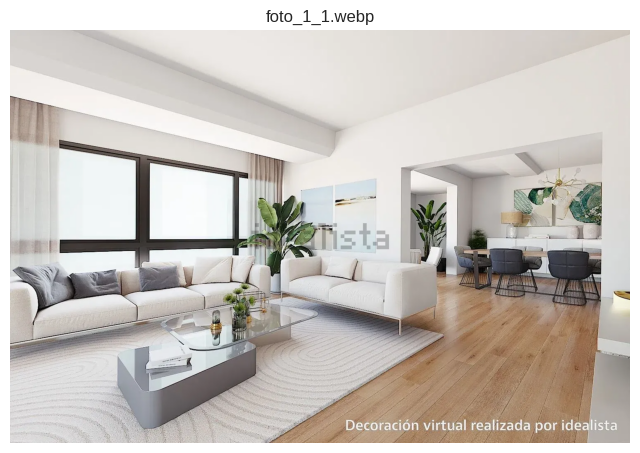

2: foto_1_2.webp


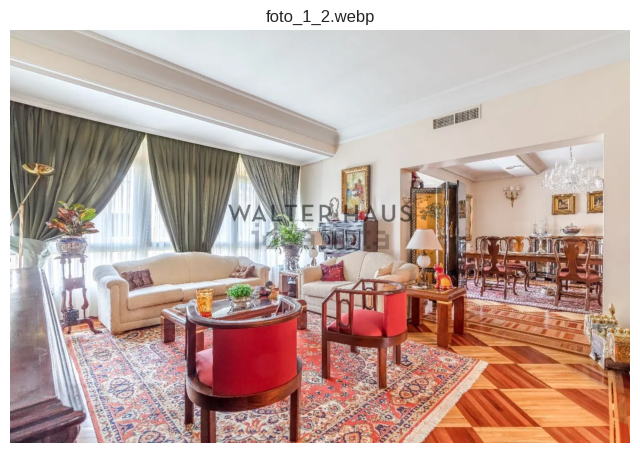

3: foto_1_5.webp


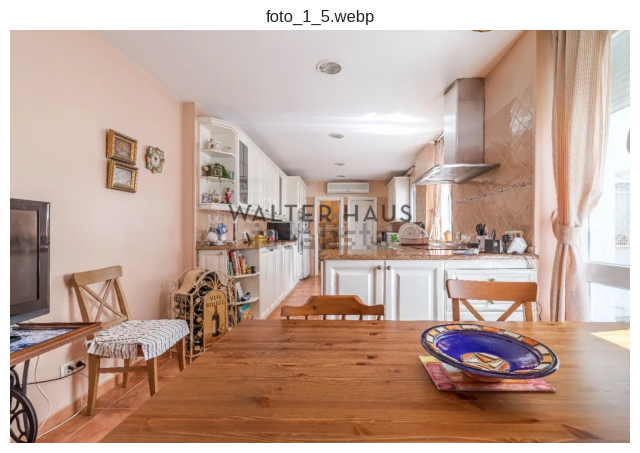

4: foto_1_4.webp


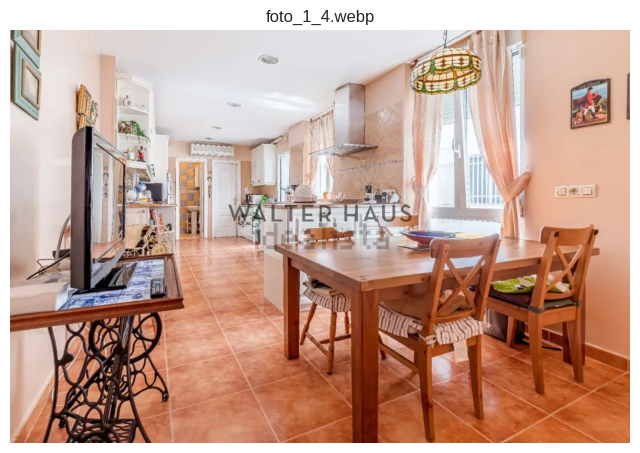

5: foto_1_3.webp


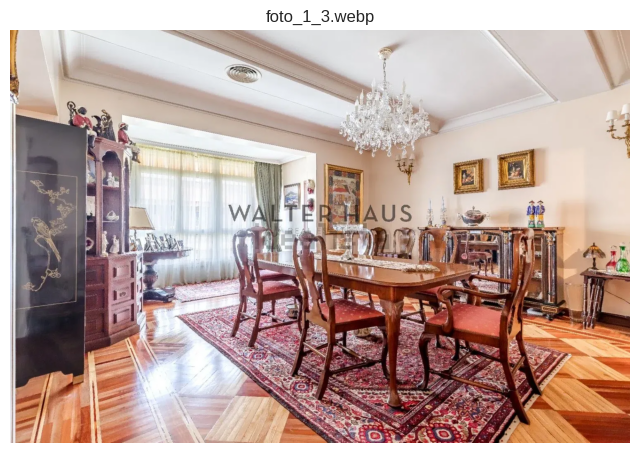

In [ ]:
# Ejemplo 4 primeras fotos

# Listar todos los archivos en la carpeta especificada
all_files = os.listdir(image_folder_path)

# Filtrar para obtener solo los archivos .webp que empiezan con 'foto_0_'
target_files = [f for f in all_files if f.lower().endswith('.webp') and f.lower().startswith('foto_1_')]

# Obtener los nombres de los primeros 4 de estos archivos
first_4_target_files = target_files[:5]

# Mostrar y listar los primeros 4 de estos archivos
print("Listando y mostrando los primeros 4 archivos .webp que empiezan con 'foto_0_':")
for i, filename in enumerate(first_4_target_files):
    # Imprimir el nombre del archivo
    print(f"{i+1}: {filename}")
    # Construir la ruta completa al archivo de imagen
    image_path = os.path.join(image_folder_path, filename)
    try:
        # Abrir la imagen usando la biblioteca Pillow (PIL)
        img = Image.open(image_path)
        # Mostrar la imagen
        plt.imshow(img)
        # Poner el nombre del archivo como título del gráfico
        plt.title(filename)
        # Ocultar los ejes del gráfico para una mejor visualización de la imagen
        plt.axis('off')
        # Mostrar el gráfico con la imagen
        plt.show()
    except Exception as e:
        # Capturar y mostrar cualquier error que ocurra al intentar abrir la imagen
        print(f"No se pudo abrir la imagen {filename}: {e}")

In [ ]:
import torch
import torchvision.transforms as T
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Cargar el modelo MiDaS
midas = torch.hub.load("intel-isl/MiDaS", "DPT_Large")
midas.to("cuda" if torch.cuda.is_available() else "cpu").eval()

# Transformaciones necesarias
transform = T.Compose([
    T.Resize((384, 384)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

def estimate_height(image_path):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0).to("cuda" if torch.cuda.is_available() else "cpu")

    with torch.no_grad():
        prediction = midas(input_tensor)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img.size[::-1],
            mode="bicubic",
            align_corners=False,
        ).squeeze()

    depth_map = prediction.cpu().numpy()

    # Mostrar imagen + profundidad
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Imagen original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(depth_map, cmap="inferno")
    plt.title("Mapa de profundidad")
    plt.axis("off")
    plt.show()

    # Heurística de altura relativa suelo-techo (en proporción, no en metros)
    techo = np.percentile(depth_map[:depth_map.shape[0]//5, :], 90)
    suelo = np.percentile(depth_map[-depth_map.shape[0]//5:, :], 10)
    diff = abs(suelo - techo)

    if diff < 0.1:
        return "No aplicable (posible terraza o sin suelo/techo visible)"
    else:
        altura_relativa = diff / depth_map.max()  # valor entre 0 y 1
        return f"Altura detectable (relativa): {altura_relativa:.2f}"



Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


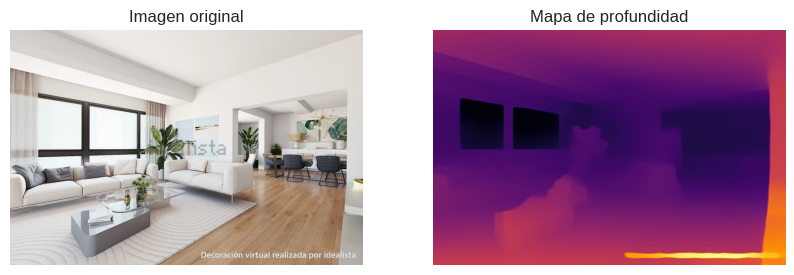

foto_1_1.webp ➜ Altura detectable (relativa): 0.08


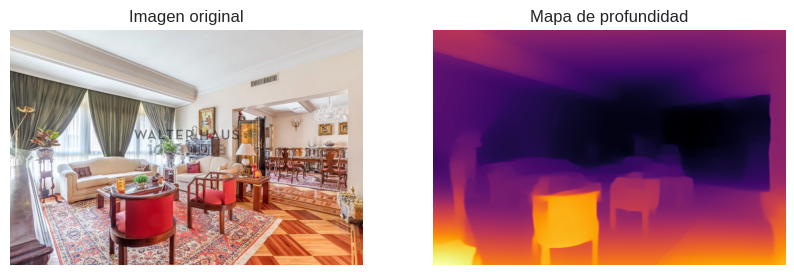

foto_1_2.webp ➜ Altura detectable (relativa): 0.05


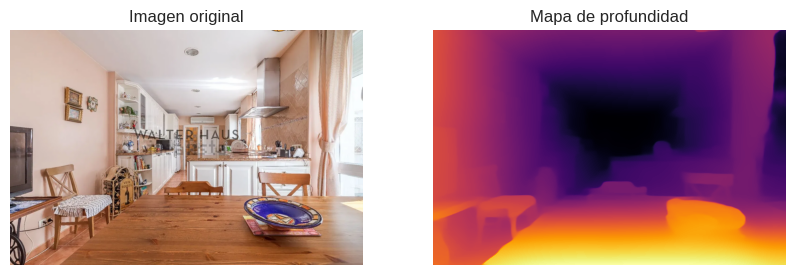

foto_1_5.webp ➜ Altura detectable (relativa): 0.04


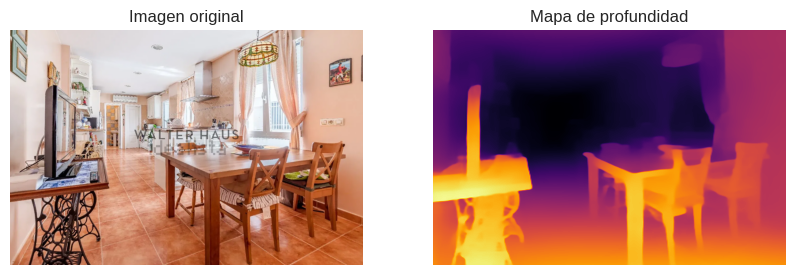

foto_1_4.webp ➜ Altura detectable (relativa): 0.10


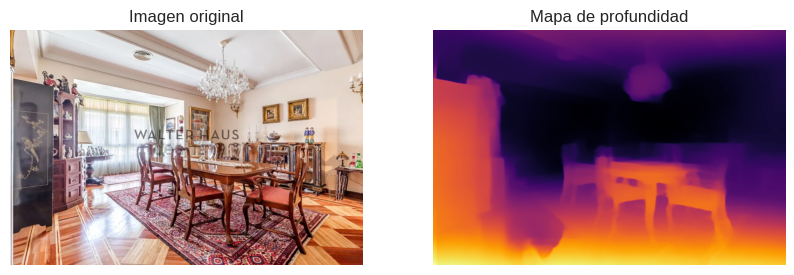

foto_1_3.webp ➜ Altura detectable (relativa): 0.19


In [ ]:
for filename in first_4_target_files:
    image_path = os.path.join(image_folder_path, filename)
    resultado = estimate_height(image_path)
    print(f"{filename} ➜ {resultado}")


Listando y mostrando los primeros 4 archivos .webp que empiezan con 'foto_0_':
1: foto_1231_4.webp


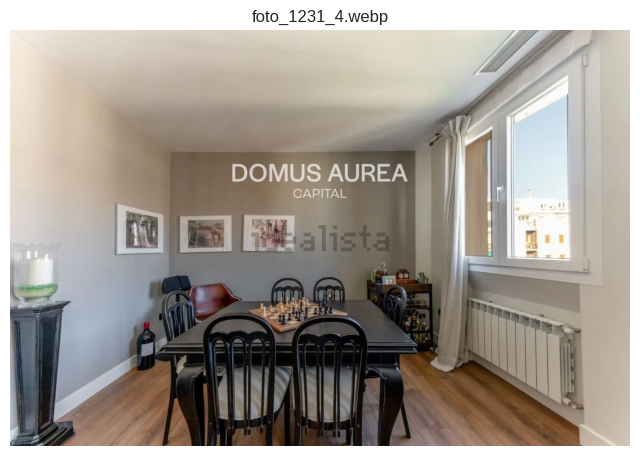

2: foto_1231_2.webp


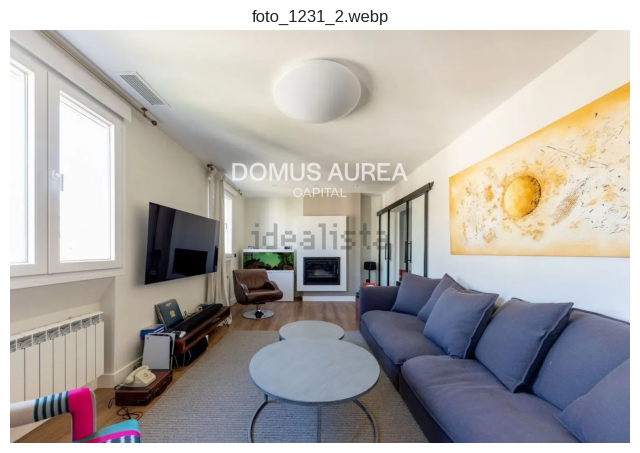

3: foto_1231_3.webp


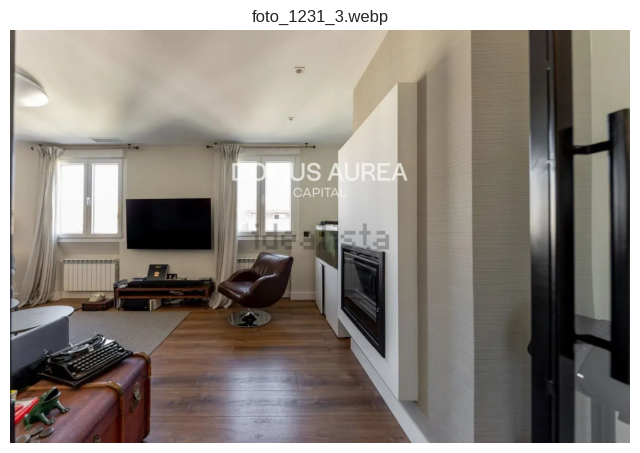

4: foto_1231_1.webp


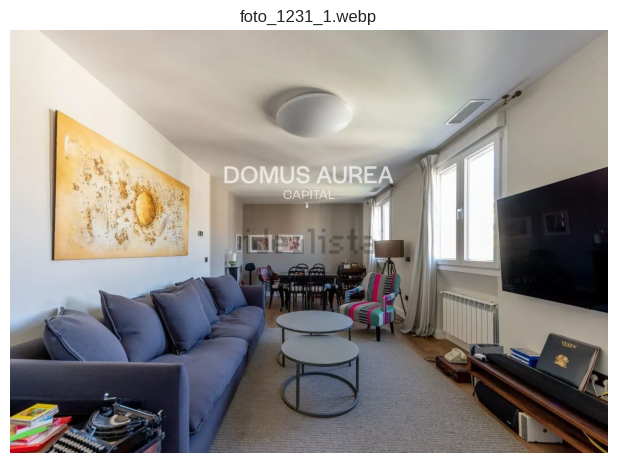

5: foto_1231_5.webp


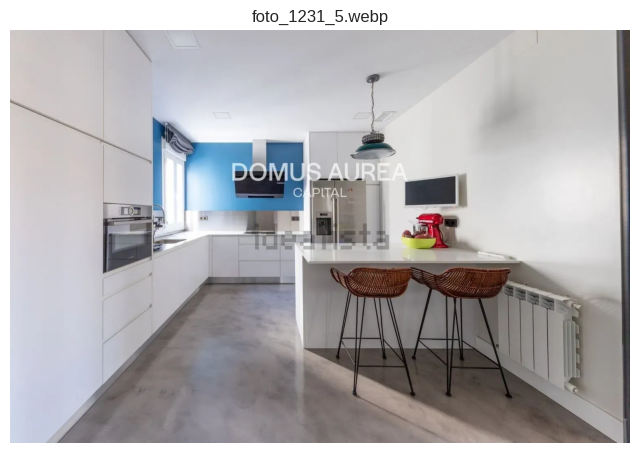

In [ ]:
# Ejemplo 4 primeras fotos

# Listar todos los archivos en la carpeta especificada
all_files = os.listdir(image_folder_path)

# Filtrar para obtener solo los archivos .webp que empiezan con 'foto_0_'
target_files = [f for f in all_files if f.lower().endswith('.webp') and f.lower().startswith('foto_1231_')]

# Obtener los nombres de los primeros 4 de estos archivos
first_4_target_files = target_files[:5]

# Mostrar y listar los primeros 4 de estos archivos
print("Listando y mostrando los primeros 4 archivos .webp que empiezan con 'foto_0_':")
for i, filename in enumerate(first_4_target_files):
    # Imprimir el nombre del archivo
    print(f"{i+1}: {filename}")
    # Construir la ruta completa al archivo de imagen
    image_path = os.path.join(image_folder_path, filename)
    try:
        # Abrir la imagen usando la biblioteca Pillow (PIL)
        img = Image.open(image_path)
        # Mostrar la imagen
        plt.imshow(img)
        # Poner el nombre del archivo como título del gráfico
        plt.title(filename)
        # Ocultar los ejes del gráfico para una mejor visualización de la imagen
        plt.axis('off')
        # Mostrar el gráfico con la imagen
        plt.show()
    except Exception as e:
        # Capturar y mostrar cualquier error que ocurra al intentar abrir la imagen
        print(f"No se pudo abrir la imagen {filename}: {e}")

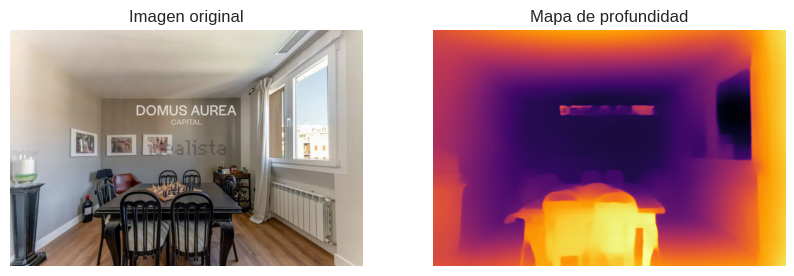

foto_1231_4.webp ➜ Altura detectable (relativa): 0.35


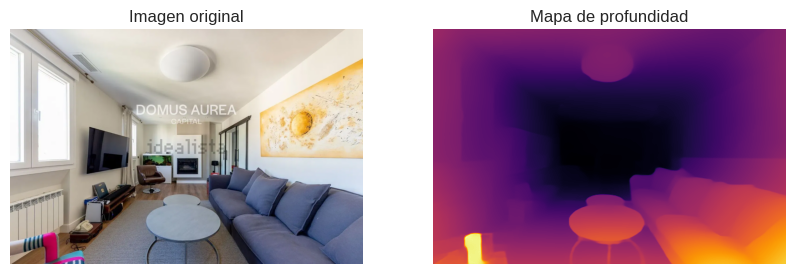

foto_1231_2.webp ➜ Altura detectable (relativa): 0.01


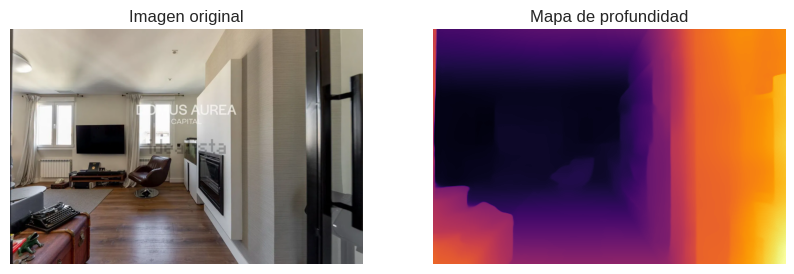

foto_1231_3.webp ➜ Altura detectable (relativa): 0.45


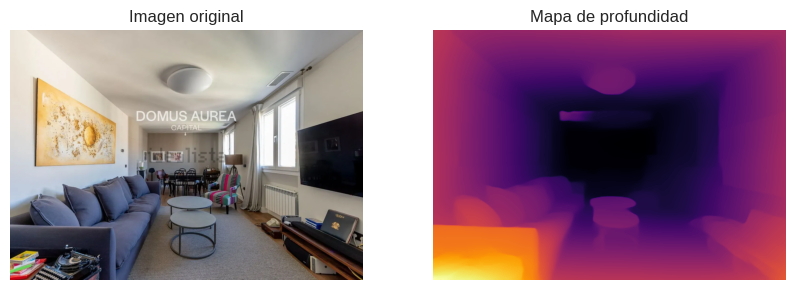

foto_1231_1.webp ➜ Altura detectable (relativa): 0.11


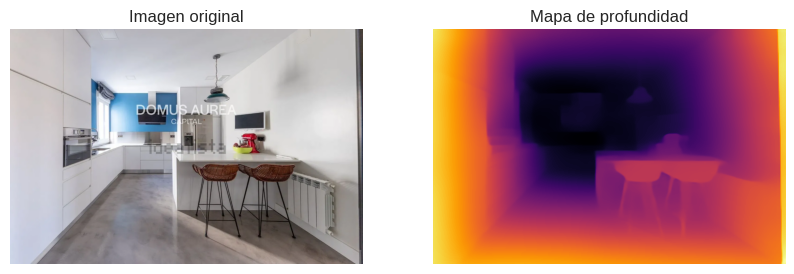

foto_1231_5.webp ➜ Altura detectable (relativa): 0.23


In [ ]:
for filename in first_4_target_files:
    image_path = os.path.join(image_folder_path, filename)
    resultado = estimate_height(image_path)
    print(f"{filename} ➜ {resultado}")

In [ ]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore')

class SimpleCeilingHeightEstimator:
    def __init__(self):
        # Rangos típicos de altura de techo en Madrid
        self.height_ranges = {
            'low': (2.3, 2.6),      # Pisos modernos/reformados
            'medium': (2.6, 3.0),   # Estándar
            'high': (3.0, 3.8),     # Edificios clásicos con techos altos
            'very_high': (3.8, 4.5) # Edificios señoriales
        }

    def analyze_image_characteristics(self, image):
        """Analiza características visuales básicas de la imagen"""
        height, width, _ = image.shape

        # Convertir a escala de grises para análisis
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        # 1. RATIO DE ASPECTO DE LA IMAGEN
        aspect_ratio = height / width

        # 2. DETECTAR LÍNEAS VERTICALES PROMINENTES (esquinas, marcos)
        edges = cv2.Canny(gray, 50, 150, apertureSize=3)
        lines = cv2.HoughLines(edges, 1, np.pi/180, threshold=int(height*0.3))

        vertical_lines = 0
        if lines is not None:
            for line in lines:
                _, theta = line[0]
                # Contar líneas verticales
                if abs(theta) < 0.3 or abs(theta - np.pi) < 0.3:
                    vertical_lines += 1

        # 3. ANALIZAR DISTRIBUCIÓN DE INTENSIDAD VERTICAL
        # Dividir imagen en franjas horizontales
        strip_height = height // 10
        brightness_profile = []

        for i in range(10):
            start_y = i * strip_height
            end_y = min((i + 1) * strip_height, height)
            strip = gray[start_y:end_y, :]
            avg_brightness = np.mean(strip)
            brightness_profile.append(avg_brightness)

        # 4. DETECTAR CARACTERÍSTICAS ARQUITECTÓNICAS
        # Buscar patrones que indiquen techos altos vs bajos

        # Variación de brillo en la parte superior (posible techo decorativo)
        upper_variation = np.std(brightness_profile[:3])

        # Contraste general de la imagen
        overall_contrast = np.std(gray)

        # Presencia de elementos en la parte superior de la imagen
        upper_third = gray[:height//3, :]
        upper_edges = cv2.Canny(upper_third, 50, 150)
        upper_edge_density = np.sum(upper_edges > 0) / upper_third.size

        return {
            'aspect_ratio': aspect_ratio,
            'vertical_lines': vertical_lines,
            'brightness_profile': brightness_profile,
            'upper_variation': upper_variation,
            'overall_contrast': overall_contrast,
            'upper_edge_density': upper_edge_density,
            'image_height': height,
            'image_width': width
        }

    def classify_ceiling_type(self, characteristics):
        """Clasifica el tipo de techo basándose en características visuales"""

        # Inicializar puntuaciones para cada tipo
        scores = {
            'low': 0,
            'medium': 0,
            'high': 0,
            'very_high': 0
        }

        # FACTOR 1: Ratio de aspecto de la imagen
        aspect_ratio = characteristics['aspect_ratio']
        if aspect_ratio < 0.6:  # Imagen muy ancha = vista panorámica = techo bajo
            scores['low'] += 2
            scores['medium'] += 1
        elif aspect_ratio < 0.8:  # Imagen moderadamente ancha
            scores['medium'] += 2
            scores['low'] += 1
        elif aspect_ratio < 1.2:  # Imagen cuadrada
            scores['medium'] += 2
            scores['high'] += 1
        else:  # Imagen alta = posible techo alto
            scores['high'] += 2
            scores['very_high'] += 1
            if aspect_ratio > 1.5:
                scores['very_high'] += 1

        # FACTOR 2: Líneas verticales (elementos arquitectónicos)
        vertical_lines = characteristics['vertical_lines']
        if vertical_lines > 8:  # Muchas líneas = arquitectura compleja = techo alto
            scores['high'] += 2
            scores['very_high'] += 1
        elif vertical_lines > 4:
            scores['medium'] += 1
            scores['high'] += 1
        else:
            scores['low'] += 1
            scores['medium'] += 1

        # FACTOR 3: Variación en la parte superior (molduras, decoración)
        upper_variation = characteristics['upper_variation']
        if upper_variation > 30:  # Mucha variación = decoración = techo alto
            scores['high'] += 2
            scores['very_high'] += 1
        elif upper_variation > 15:
            scores['medium'] += 1
            scores['high'] += 1
        else:
            scores['low'] += 1
            scores['medium'] += 1

        # FACTOR 4: Densidad de bordes en parte superior
        upper_edge_density = characteristics['upper_edge_density']
        if upper_edge_density > 0.1:  # Muchos detalles arriba = techo decorado
            scores['high'] += 1
            scores['very_high'] += 1
        elif upper_edge_density > 0.05:
            scores['medium'] += 1
        else:
            scores['low'] += 1

        # FACTOR 5: Contraste general
        overall_contrast = characteristics['overall_contrast']
        if overall_contrast > 60:  # Alto contraste = espacios amplios = techos altos
            scores['high'] += 1
            scores['very_high'] += 1
        elif overall_contrast > 40:
            scores['medium'] += 1
        else:
            scores['low'] += 1

        # Encontrar la categoría con mayor puntuación
        best_category = max(scores.keys(), key=lambda k: scores[k])
        confidence = scores[best_category] / sum(scores.values())

        return best_category, confidence, scores

    def estimate_height_from_category(self, category, confidence):
        """Convierte la categoría en una altura específica"""
        range_min, range_max = self.height_ranges[category]

        # Usar un valor dentro del rango, ajustado por confianza
        if confidence > 0.7:
            # Alta confianza: usar valor medio del rango
            height = (range_min + range_max) / 2
        elif confidence > 0.5:
            # Confianza media: tender hacia el centro general (2.7m)
            height = (range_min + range_max) / 2
            height = height * 0.7 + 2.7 * 0.3  # Mezclar con valor conservador
        else:
            # Baja confianza: usar valor conservador
            height = 2.7

        # Añadir pequeña variación aleatoria para evitar valores idénticos
        height += np.random.normal(0, 0.05)  # ±5cm de variación

        return max(2.2, min(4.5, height))  # Limitar entre 2.2 y 4.5m

    def analyze_single_image(self, image_path):
        """Analiza una sola imagen"""
        try:
            # Cargar imagen
            if isinstance(image_path, str):
                image = cv2.imread(image_path)
                if image is None:
                    raise ValueError(f"No se pudo cargar la imagen: {image_path}")
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            else:
                image = image_path

            # Analizar características
            characteristics = self.analyze_image_characteristics(image)

            # Clasificar tipo de techo
            category, confidence, scores = self.classify_ceiling_type(characteristics)

            # Estimar altura
            estimated_height = self.estimate_height_from_category(category, confidence)

            return {
                'estimated_height': round(estimated_height, 2),
                'category': category,
                'confidence': round(confidence, 2),
                'scores': scores,
                'characteristics': characteristics
            }

        except Exception as e:
            print(f"Error analizando imagen {image_path}: {e}")
            return {
                'estimated_height': 2.7,  # Valor por defecto
                'category': 'medium',
                'confidence': 0.2,
                'error': str(e)
            }

    def analyze_property_images(self, image_folder, property_id):
        """Analiza todas las imágenes de una propiedad"""
        try:
            # Buscar imágenes de la propiedad
            all_files = os.listdir(image_folder)
            property_files = [f for f in all_files if f.startswith(f'foto_{property_id}_') and f.lower().endswith('.webp')]

            if not property_files:
                return {
                    'property_id': property_id,
                    'estimated_height': 2.7,
                    'confidence': 0.2,
                    'images_analyzed': 0,
                    'method': 'no_images_found'
                }

            # Analizar cada imagen
            results = []
            for filename in property_files:
                image_path = os.path.join(image_folder, filename)
                result = self.analyze_single_image(image_path)
                result['filename'] = filename
                results.append(result)

            # Combinar resultados
            valid_results = [r for r in results if 'error' not in r]

            if not valid_results:
                return {
                    'property_id': property_id,
                    'estimated_height': 2.7,
                    'confidence': 0.2,
                    'images_analyzed': len(results),
                    'method': 'all_errors'
                }

            # Calcular estadísticas
            heights = [r['estimated_height'] for r in valid_results]
            confidences = [r['confidence'] for r in valid_results]
            categories = [r['category'] for r in valid_results]

            # Altura final: mediana (más robusta que media)
            final_height = np.median(heights)

            # Confianza final: promedio ponderado
            final_confidence = np.mean(confidences)

            # Ajustar confianza según consistencia
            height_std = np.std(heights)
            if height_std < 0.2:  # Muy consistente
                final_confidence = min(0.9, final_confidence + 0.2)
            elif height_std < 0.4:  # Razonablemente consistente
                final_confidence = final_confidence
            else:  # Inconsistente
                final_confidence = max(0.3, final_confidence - 0.2)

            # Categoría más común
            most_common_category = max(set(categories), key=categories.count)

            return {
                'property_id': property_id,
                'estimated_height': round(final_height, 2),
                'confidence': round(final_confidence, 2),
                'images_analyzed': len(valid_results),
                'height_std': round(height_std, 2),
                'most_common_category': most_common_category,
                'method': 'multi_image_median',
                'individual_results': results
            }

        except Exception as e:
            print(f"Error procesando propiedad {property_id}: {e}")
            return {
                'property_id': property_id,
                'estimated_height': 2.7,
                'confidence': 0.2,
                'images_analyzed': 0,
                'method': 'error',
                'error': str(e)
            }

def estimate_ceiling_heights_batch(image_folder_path, output_file='ceiling_heights.csv', max_properties=None):
    """Procesa todas las propiedades y genera CSV"""
    estimator = SimpleCeilingHeightEstimator()

    # Obtener IDs únicos de propiedades
    all_files = os.listdir(image_folder_path)
    property_ids = set()

    for filename in all_files:
        if filename.startswith('foto_') and filename.endswith('.webp'):
            try:
                parts = filename.split('_')
                if len(parts) >= 2:
                    property_id = parts[1]
                    property_ids.add(property_id)
            except:
                continue

    property_ids = sorted(list(property_ids))
    if max_properties:
        property_ids = property_ids[:max_properties]

    print(f"Procesando {len(property_ids)} propiedades...")

    # Procesar cada propiedad
    results = []
    for i, prop_id in enumerate(property_ids):
        if (i + 1) % 50 == 0:
            print(f"Procesadas {i+1}/{len(property_ids)} propiedades...")

        result = estimator.analyze_property_images(image_folder_path, prop_id)
        results.append(result)

    # Crear DataFrame
    import pandas as pd

    df_results = pd.DataFrame([{
        'property_id': r['property_id'],
        'estimated_height_m': r['estimated_height'],
        'confidence': r['confidence'],
        'images_count': r['images_analyzed'],
        'height_std': r.get('height_std', 0),
        'category': r.get('most_common_category', 'unknown'),
        'method': r['method']
    } for r in results])

    # Guardar
    df_results.to_csv(output_file, index=False)
    print(f"\nResultados guardados en {output_file}")

    # Estadísticas
    valid_results = df_results[df_results['images_count'] > 0]
    print(f"\nEstadísticas ({len(valid_results)} propiedades válidas):")
    print(f"Altura media: {valid_results['estimated_height_m'].mean():.2f}m")
    print(f"Desviación estándar: {valid_results['estimated_height_m'].std():.2f}m")
    print(f"Rango: {valid_results['estimated_height_m'].min():.2f}m - {valid_results['estimated_height_m'].max():.2f}m")
    print(f"Confianza promedio: {valid_results['confidence'].mean():.2f}")

    # Distribución por categorías
    print(f"\nDistribución por categorías:")
    for category in valid_results['category'].value_counts().index:
        count = valid_results['category'].value_counts()[category]
        avg_height = valid_results[valid_results['category'] == category]['estimated_height_m'].mean()
        print(f"  {category}: {count} propiedades (altura media: {avg_height:.2f}m)")

    return df_results, results

def test_single_property(image_folder_path, property_id):
    """Prueba el algoritmo con una propiedad específica"""
    estimator = SimpleCeilingHeightEstimator()
    result = estimator.analyze_property_images(image_folder_path, property_id)

    print(f"\n=== RESULTADO PARA PROPIEDAD {property_id} ===")
    print(f"Altura estimada: {result['estimated_height']}m")
    print(f"Categoría: {result.get('most_common_category', 'N/A')}")
    print(f"Confianza: {result['confidence']:.2f}")
    print(f"Imágenes analizadas: {result['images_analyzed']}")
    print(f"Desviación entre imágenes: {result.get('height_std', 0):.2f}m")
    print(f"Método: {result['method']}")

    # Mostrar detalles de cada imagen si están disponibles
    if 'individual_results' in result:
        print(f"\nDetalle por imagen:")
        for img_result in result['individual_results']:
            if 'error' not in img_result:
                print(f"  {img_result['filename']}: {img_result['estimated_height']}m "
                      f"({img_result['category']}, conf: {img_result['confidence']:.2f})")

    return result

# Ejemplo de uso:
# result = test_single_property(image_folder_path, '1')
# df_results, all_results = estimate_ceiling_heights_batch(image_folder_path, max_properties=10)

In [ ]:
# Assuming the SimpleCeilingHeightEstimator class and its methods are defined in your notebook

# Ruta a la carpeta de imágenes (usando la variable que ya tienes definida)
image_folder_path = '/content/drive/MyDrive/CEU SAN PABLO/TFM/fotos' # O la ruta que uses tú

# ID de la propiedad que queremos analizar (basado en los nombres de archivo 'foto_1231_...')
property_id_to_test = '749' # Use '1231' as the property ID

# Crear una instancia de la clase SimpleCeilingHeightEstimator
estimator = SimpleCeilingHeightEstimator()

# Llamar a la función analyze_property_images para esta propiedad específica
# Esta función ya maneja la búsqueda de todas las fotos con ese ID en la carpeta
result = estimator.analyze_property_images(image_folder_path, property_id_to_test)

# Imprimir el resultado del análisis para esta propiedad
print(f"\nResultado del análisis de altura para la propiedad {property_id_to_test}:")
print(f"Altura estimada: {result['estimated_height']}m")
print(f"Confianza: {result['confidence']:.2f}")
print(f"Imágenes analizadas: {result['images_analyzed']}")
print(f"Desviación estándar entre imágenes: {result.get('height_std', 0):.2f}m")
print(f"Método principal: {result['method']}")
print(f"Categoría de techo más común: {result.get('most_common_category', 'N/A')}")

# Opcional: Puedes imprimir los resultados individuales de cada imagen si quieres ver más detalle
# print("\nResultados individuales por imagen:")
# if 'individual_results' in result:
#     for img_res in result['individual_results']:
#        if 'error' not in img_res:
#            print(f"  - {img_res['filename']}: {img_res['estimated_height']}m "
#                  f"(Confianza: {img_res['confidence']:.2f}, Categoría: {img_res['category']})")
#        else:
#            print(f"  - {img_res['filename']}: Error - {img_res['error']}")


Resultado del análisis de altura para la propiedad 749:
Altura estimada: 2.74m
Confianza: 0.70
Imágenes analizadas: 5
Desviación estándar entre imágenes: 0.06m
Método principal: multi_image_median
Categoría de techo más común: medium


In [ ]:
df_barrio.head(10)

,address,agency_name,bathroom_count,bedroom_count,floor,latitude,longitude,lot_size,property_description,property_images,property_price,property_title,neighborhood,exterior,ascensor,property_type_chalet,property_type_flat,energy_certificate_encoded
1032,Calle del Doce de Octubre,Walter Haus Madrid,3,3,4.0,40.414837,-3.677285,140,"Descubre esta joya arquitectónica, un piso a e...",['https://img4.idealista.com/blur/WEB_DETAIL-X...,1275000,"Piso en venta reformado en Ibiza, Madrid.",Retiro,0.0,1.0,False,True,4
1033,Calle del Doce de Octubre,Engel & Völkers Madrid,3,3,4.0,40.417498,-3.676082,140,"Piso alto reformado, amueblado con terraza a 2...",['https://img4.idealista.com/blur/WEB_DETAIL-X...,1275000,Piso en calle del Doce de Octubre,Retiro,1.0,1.0,False,True,4
1034,Calle de Ibiza,Walter Haus Madrid,2,2,1.0,40.416619,-3.674105,115,Te presentamos una oportunidad única de adquir...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,1350000,"Piso en venta a estrenar en Ibiza, Madrid.",Retiro,1.0,1.0,False,True,6
1035,Barrio Jerónimos,Gilmar distrito Jerónimos-Retiro,3,2,6.0,40.412869,-3.688905,108,¡Descubre el ático dúplex de tus sueños en el ...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,1695000,Gilmar Retiro (911218484) Exclusivo ático dúpl...,Retiro,1.0,1.0,False,True,2
1037,Calle de Ibiza,DIZA Consultores Inmobiliaria - Propiedades de...,1,1,5.0,40.416362,-3.677929,88,DIZA consultores les presenta ático a unos pas...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,790000,Ático en calle de Ibiza,Retiro,1.0,1.0,False,True,4
1040,Calle de los Astros,DIZA Consultores Inmobiliaria - Propiedades de...,2,2,3.0,40.412686,-3.669839,101,DIZA Consultores presenta este piso en urbaniz...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,895000,Piso en calle de los Astros,Retiro,1.0,1.0,False,True,0
1041,Calle del Doce de Octubre,DIZA Consultores Inmobiliaria - Propiedades de...,3,3,4.0,40.417009,-3.676170,140,DIZA Consultores les presenta piso recién refo...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,1275000,Piso en calle del Doce de Octubre,Retiro,1.0,1.0,False,True,5
1042,Barrio Jerónimos,DIZA Consultores Inmobiliaria - Propiedades de...,2,2,0.0,40.419465,-3.690303,139,DIZA Consultores les presenta esta vivienda co...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,1450000,Piso en Barrio Jerónimos,Retiro,0.0,1.0,False,True,4
1043,Calle de los Reyes Magos,Vivienda2,4,5,1.0,40.410363,-3.674290,220,VIVIENDA2 lanza al mercado en exclusiva esta i...,['https://img4.idealista.com/blur/WEB_DETAIL-X...,1917000,Piso en calle de los Reyes Magos,Retiro,1.0,1.0,False,True,4
1044,Calle de O'Donnell,Walter Haus Madrid,2,3,7.0,40.421716,-3.676948,120,"Este luminoso ático, ubicado en una séptima pl...",['https://img4.idealista.com/blur/WEB_DETAIL-X...,1339000,"Ático en venta en Ibiza, Madrid.",Retiro,0.0,1.0,False,True,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1232 entries, 0 to 1231
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   address               1232 non-null   object 
 1   agency_name           1232 non-null   object 
 2   bathroom_count        1232 non-null   int64  
 3   bedroom_count         1232 non-null   int64  
 4   energy_certificate    1232 non-null   object 
 5   floor                 1232 non-null   float64
 6   latitude              1232 non-null   float64
 7   longitude             1232 non-null   float64
 8   lot_size              1232 non-null   int64  
 9   property_description  1232 non-null   object 
 10  property_images       1232 non-null   object 
 11  property_price        1232 non-null   int64  
 12  property_title        1232 non-null   object 
 13  property_type         1232 non-null   object 
 14  neighborhood          1232 non-null   int64  
 15  exterior             

In [ ]:

import osmnx as ox
import geopandas as gpd
import pandas as pd
from scipy.spatial import cKDTree
from geopy.distance import geodesic
import numpy as np

# Define el lugar
place_name = "Madrid, Spain"

# 1. Obtener el polígono geográfico de la ciudad
city = ox.geocode_to_gdf(place_name)

# 2. Descargar estaciones de metro
metro_tags = {'railway': 'station', 'station': 'subway'}
metro_stops = ox.features_from_polygon(city.geometry[0], metro_tags)




# 1. Reproyectar las geometrías a un sistema de coordenadas en metros (CRS proyectado)
metro_stops_proj = metro_stops.to_crs(epsg=3857)  # Web Mercator: usa metros
pisos_gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs='EPSG:4326')
pisos_gdf = pisos_gdf.to_crs(epsg=3857)

# 2. Extraer coordenadas X, Y de las geometrías proyectadas (en metros)
metro_coords = np.array([(geom.centroid.y, geom.centroid.x) for geom in metro_stops_proj.geometry])
pisos_coords = np.array([(geom.y, geom.x) for geom in pisos_gdf.geometry])

# 3. Construir el KD-Tree y calcular distancias
metro_tree = cKDTree(metro_coords)
dist_metro_m, idx_metro = metro_tree.query(pisos_coords, k=1)

# 4. Añadir distancia al DataFrame original
df['dist_metro_m'] = dist_metro_m

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 2.5 MB/s eta 0:00:00
